In [100]:
import numpy as np
from PIL import Image
import os
import cv2
import matplotlib.pyplot as plt
from skimage.color import rgb2gray, rgb2hsv
from skimage import img_as_ubyte
from skimage.measure import label, find_contours
from skimage.morphology import binary_closing, binary_erosion, disk, square, binary_dilation, binary_opening
from skimage.morphology import remove_small_holes, thin, star, octagon, diamond, remove_small_objects, rectangle
from scipy.ndimage import binary_fill_holes
from skimage.filters import median
from skimage.feature import canny

In [101]:
plt.rc('image', cmap='gray')

In [102]:
#Здесь можно указать любой нужный путь со входными изображениями

#path = './cards_images/'
#image_names = os.listdir(path)
#images = [np.array(Image.open(path + name)) for name in image_names]
image_names = ['IMG_10.jpg', 'IMG_1.jpg', 'IMG_2.jpg', 'IMG_4.jpg', 'IMG_6.jpg', 'IMG_7.jpg', 'IMG_9.jpg']
images = [np.array(Image.open(name)) for name in image_names]

# **Алгоритм и демонстрация работы**

В дальнейших ячейках можно менять пути сохранения финальных и промежуточных изображений, параметров функций метода и т. д.

In [103]:
def one_channel(img, channel):
    if channel == 'r':
        return img[:, :, 0]
    elif channel == 'g':
        return img[:, :, 1]
    elif channel == 'b':
        return img[:, :, 2]
    elif channel == 'h':
        return img_as_ubyte(rgb2hsv(img))[:, :, 0]
    elif channel == 's':
        return img_as_ubyte(rgb2hsv(img))[:, :, 1]
    elif channel == 'v':
        return img_as_ubyte(rgb2hsv(img))[:, :, 2]
    elif channel == 'g':
        return img_as_ubyte(rgb2gray(img))

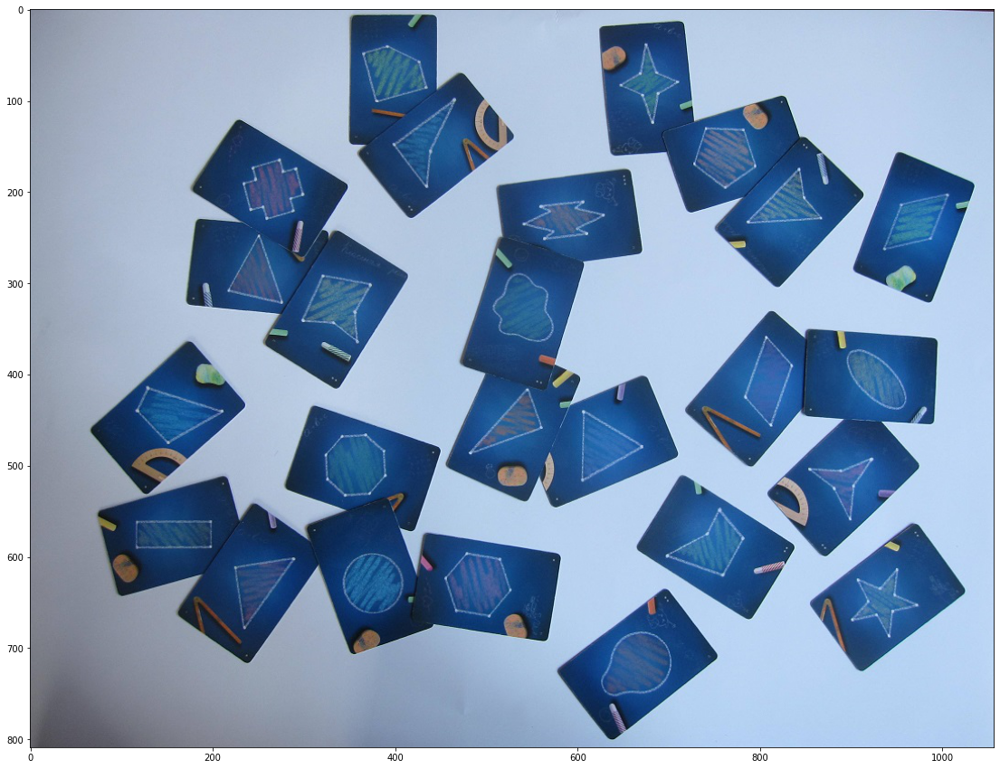

In [104]:
plt.figure(figsize=(20, 15))
plt.imshow(images[3])
plt.savefig('Example.jpg', format='jpg')

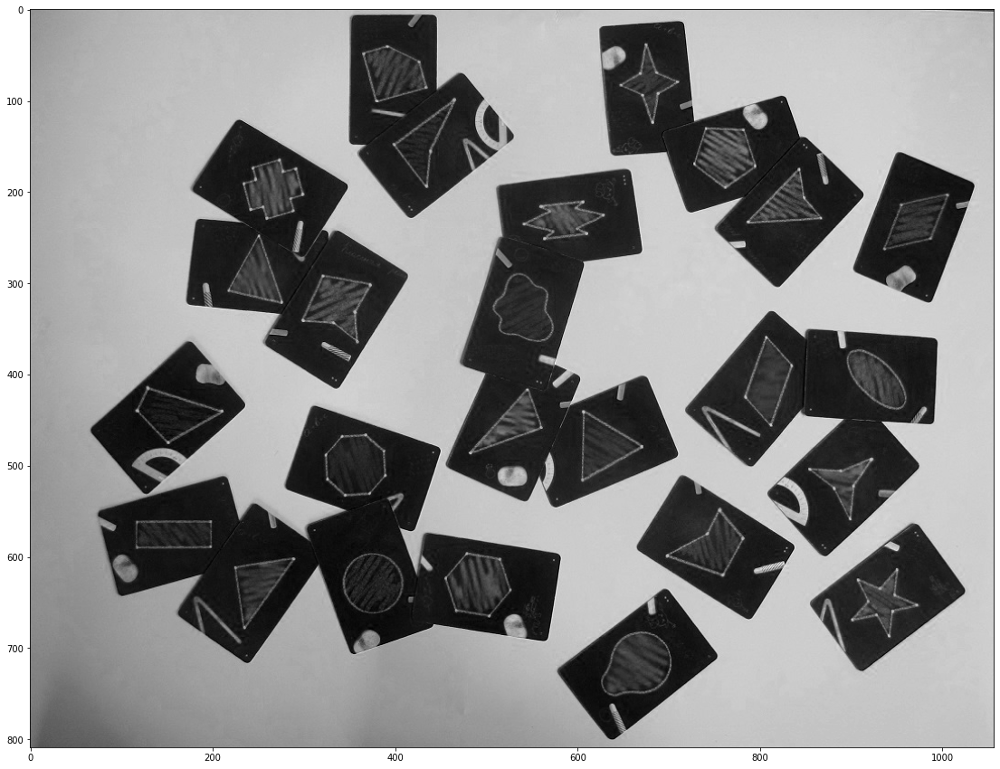

In [105]:
img_gray_scale = one_channel(images[3], 'r')
plt.figure(figsize=(20, 15))
plt.imshow(img_gray_scale)
plt.savefig('Grayscale.jpg', format='jpg')

In [106]:
def detect_cards(img, r_erosion, sigma_canny, median_size):
  mask = median(img, square(median_size))
  mask = canny(mask, sigma=sigma_canny)
  mask = binary_closing(mask, disk(3))
  mask = binary_dilation(mask, disk(3))
  mask = binary_fill_holes(mask, disk(1))
  mask = binary_erosion(mask, disk(r_erosion))
  return mask

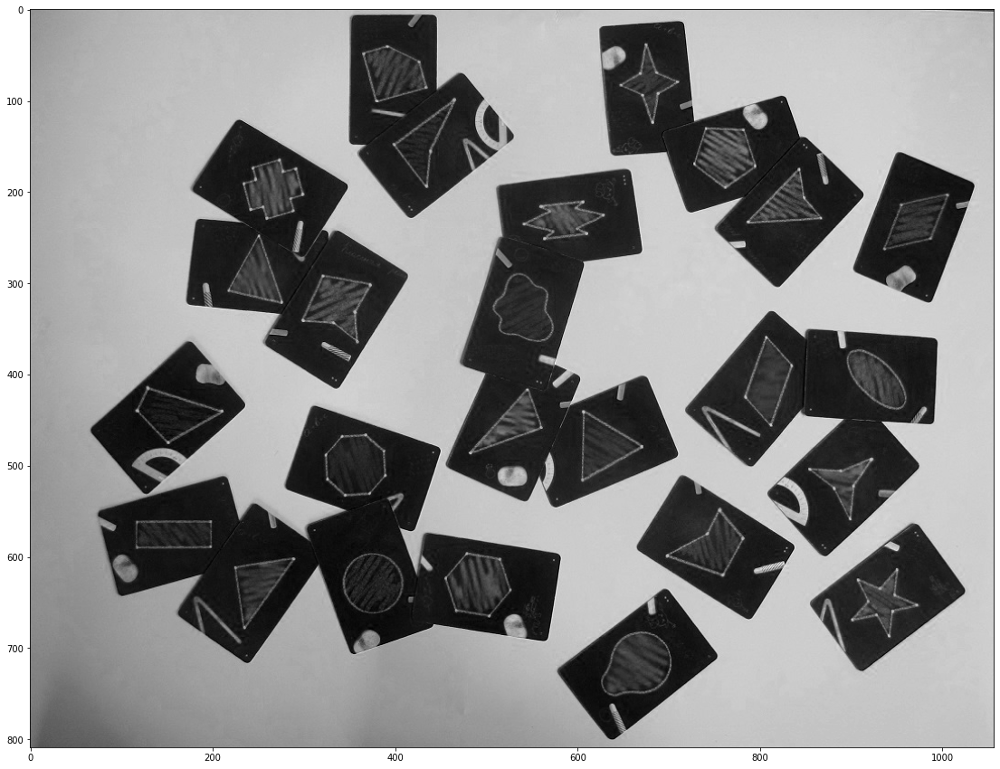

In [107]:
mask = median(img_gray_scale, square(1))
plt.figure(figsize=(20, 15))
plt.imshow(mask)
plt.savefig('Median.jpg', format='jpg')

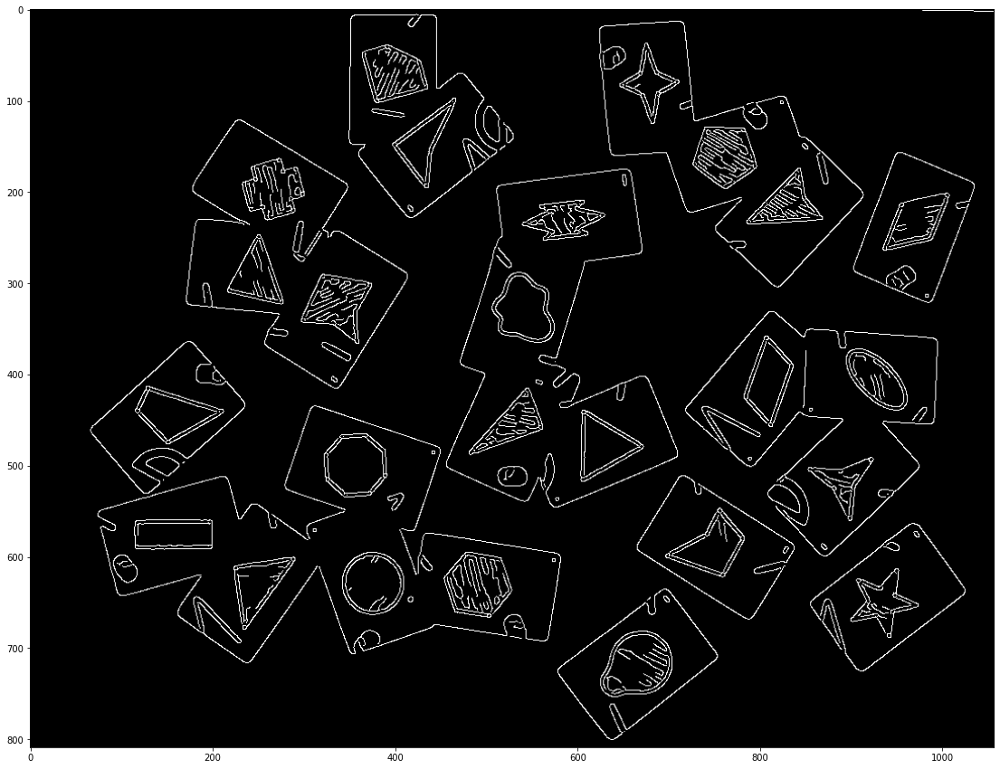

In [108]:
mask = canny(mask, sigma=1.5)
plt.figure(figsize=(20, 15))
plt.imshow(mask)
plt.savefig('Canny.jpg', format='jpg')

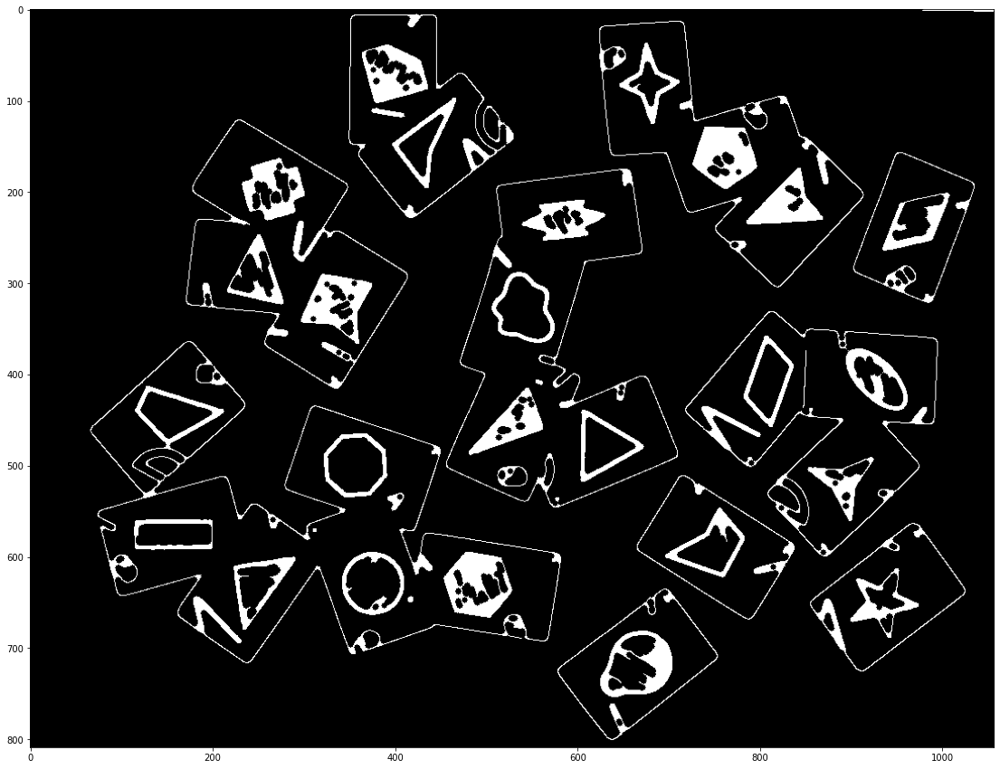

In [109]:
mask = binary_closing(mask, disk(3))
plt.figure(figsize=(20, 15))
plt.imshow(mask)
plt.savefig('Closing.jpg', format='jpg')

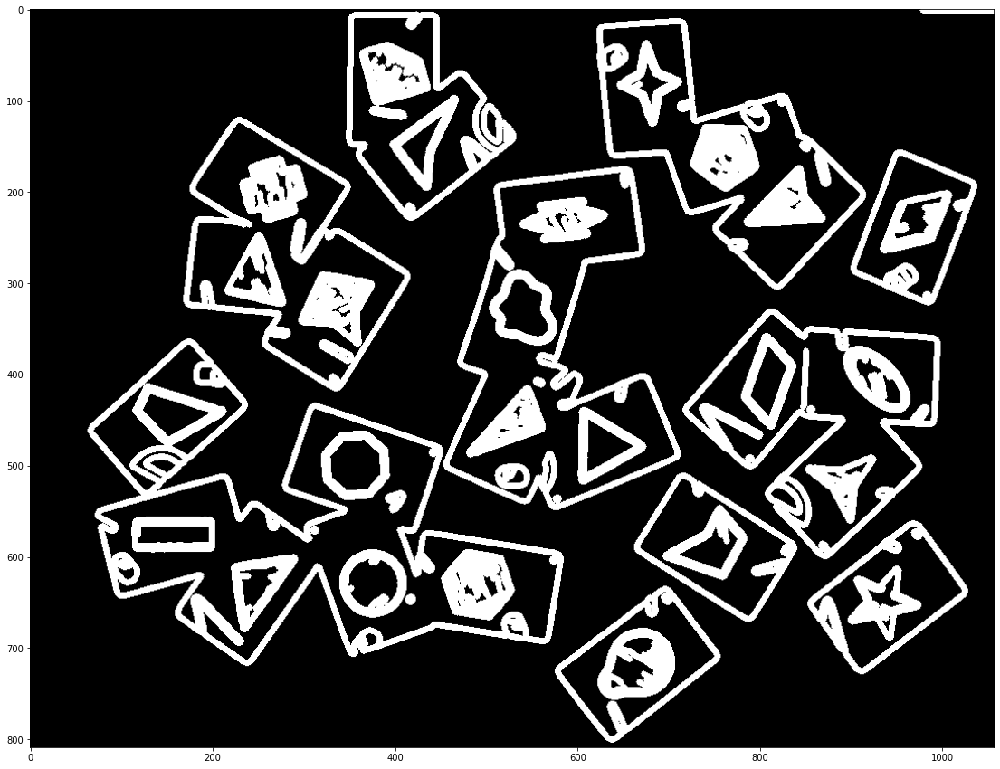

In [110]:
mask = binary_dilation(mask, disk(3))
plt.figure(figsize=(20, 15))
plt.imshow(mask)
plt.savefig('Dilation.jpg', format='jpg')

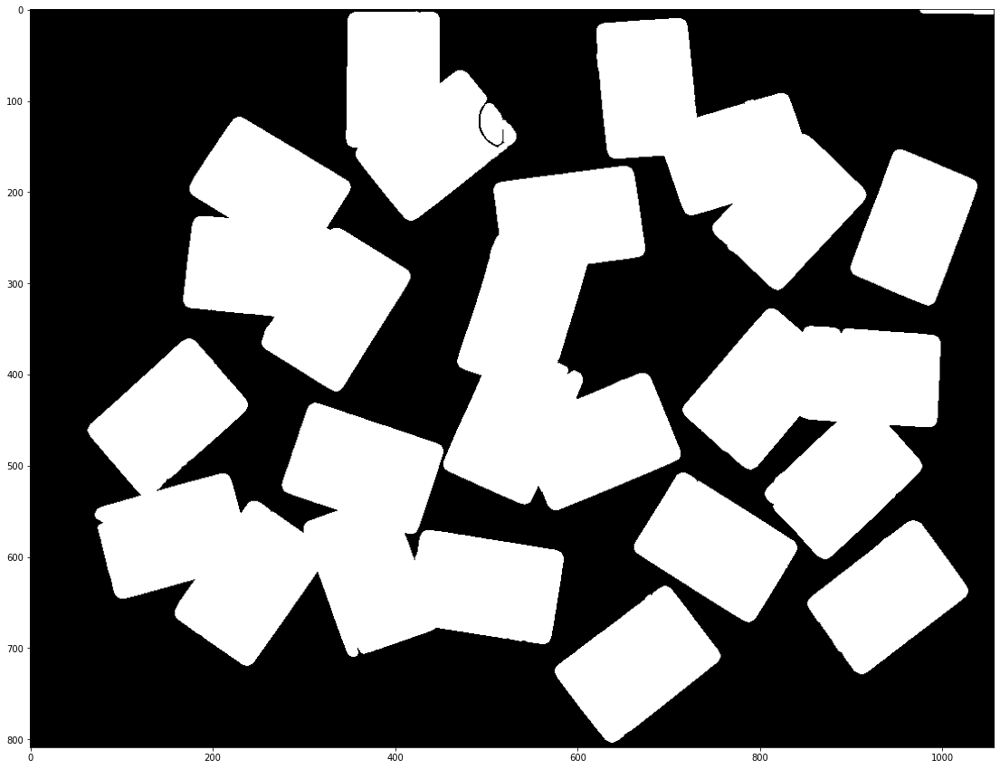

In [111]:
mask = binary_fill_holes(mask, disk(1))
plt.figure(figsize=(20, 15))
plt.imshow(mask)
plt.savefig('Fill_holes.jpg', format='jpg')

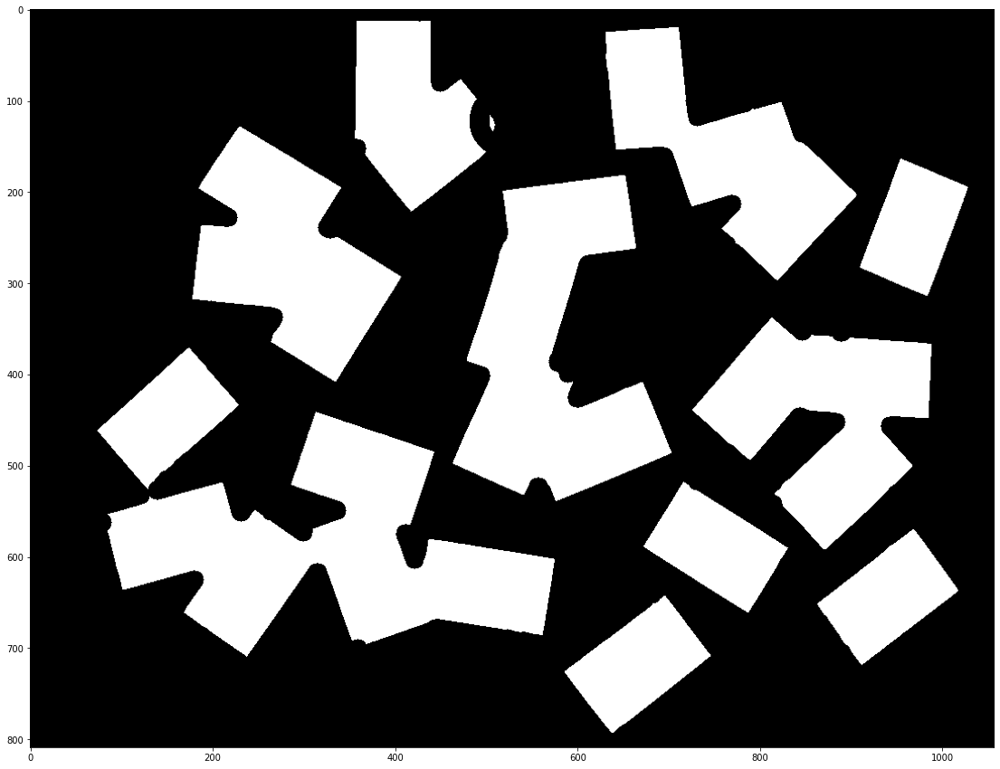

In [112]:
mask = binary_erosion(mask, disk(10))
plt.figure(figsize=(20, 15))
plt.imshow(mask)
plt.savefig('Erosion.jpg', format='jpg')

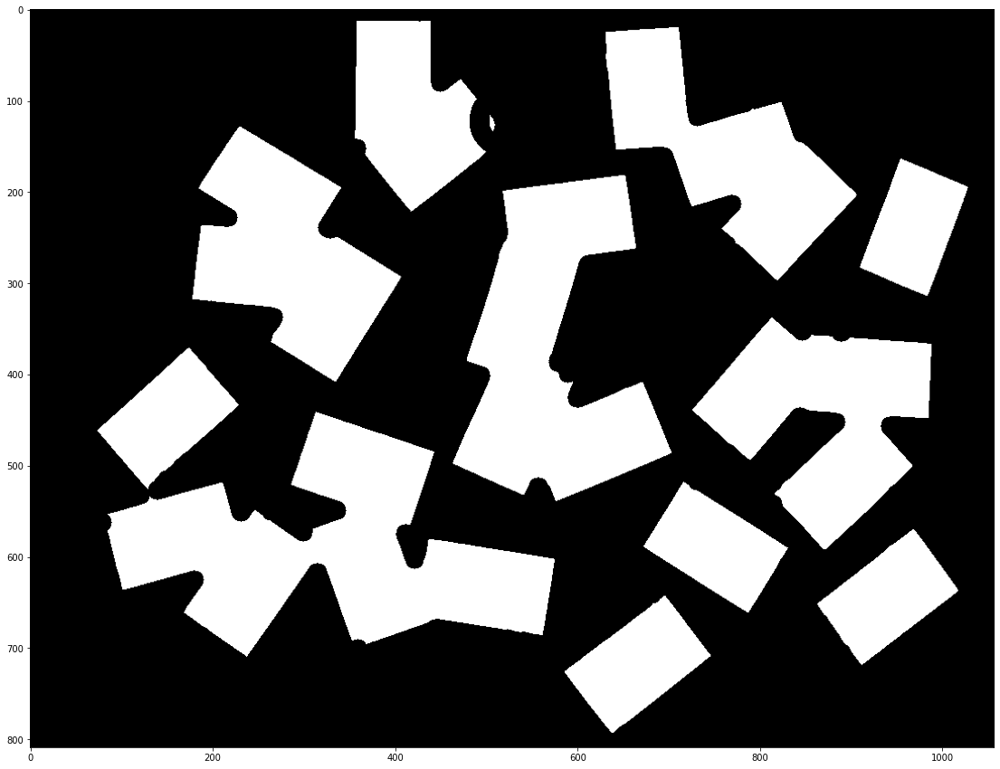

In [113]:
s_img = one_channel(images[3], 'r')
s_mask = detect_cards(s_img, 10, 1.5, 1)
plt.figure(figsize=(20, 15))
plt.imshow(s_mask)

In [114]:
def detect_figures(img_gray_scale, mask, sigma_canny, closing_primitive, erosion_primitive, remove_size):
  figures = canny(img_gray_scale, sigma=sigma_canny, mask=mask)
  figures = binary_closing(figures, closing_primitive)
  figures = remove_small_holes(figures)
  figures = binary_fill_holes(figures, disk(1))
  figures = remove_small_holes(figures)
  figures = binary_erosion(figures, erosion_primitive)
  figures = remove_small_objects(figures, min_size=remove_size)
  regions = len(np.unique(label(figures))) - 1
  return figures, regions

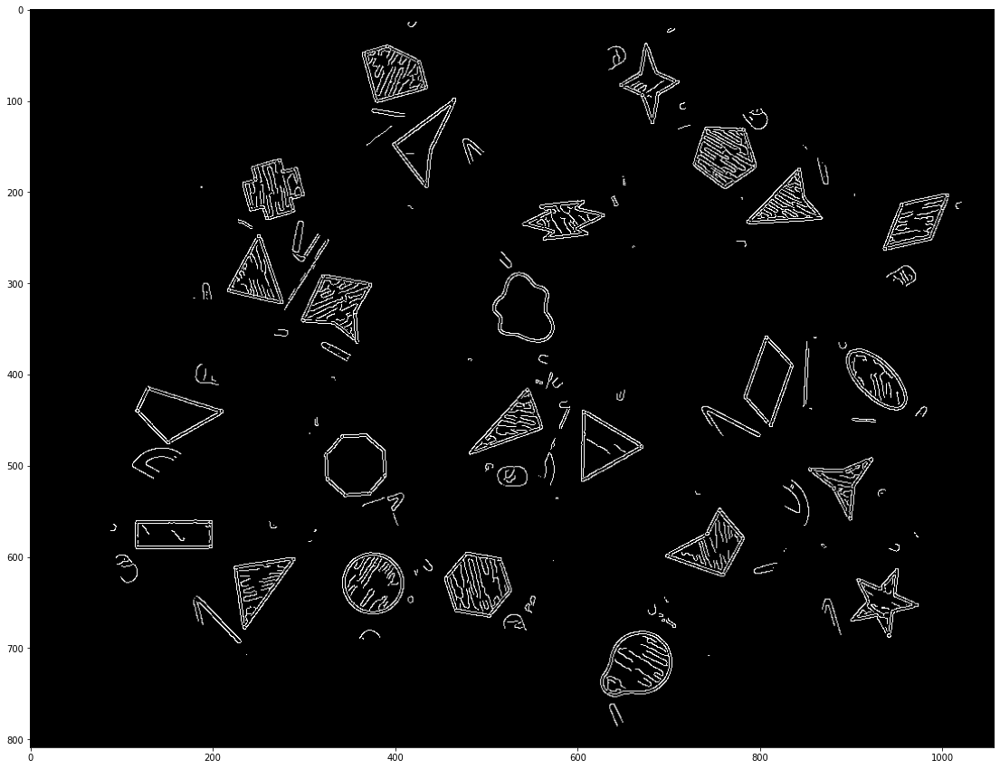

In [115]:
figures = canny(img_gray_scale, sigma=1, mask=mask)
plt.figure(figsize=(20, 15))
plt.imshow(figures)
plt.savefig('Figures_canny.jpg', format='jpg')

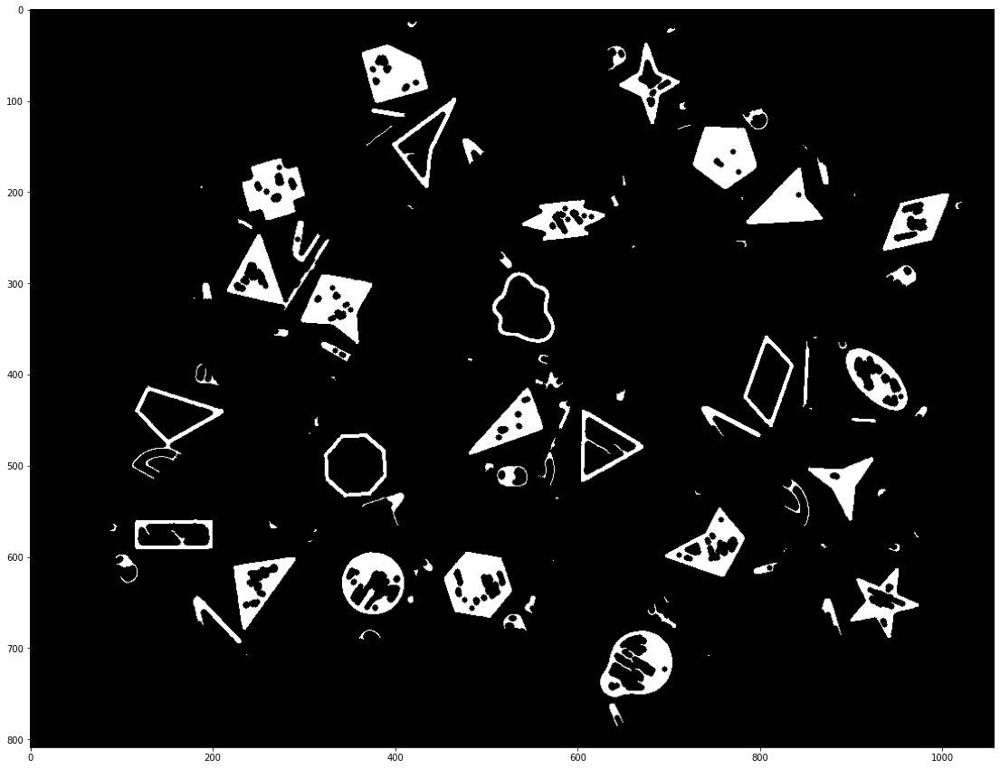

In [116]:
figures = binary_closing(figures, disk(3))
plt.figure(figsize=(20, 15))
plt.imshow(figures)
plt.savefig('Figures_closing.jpg', format='jpg')

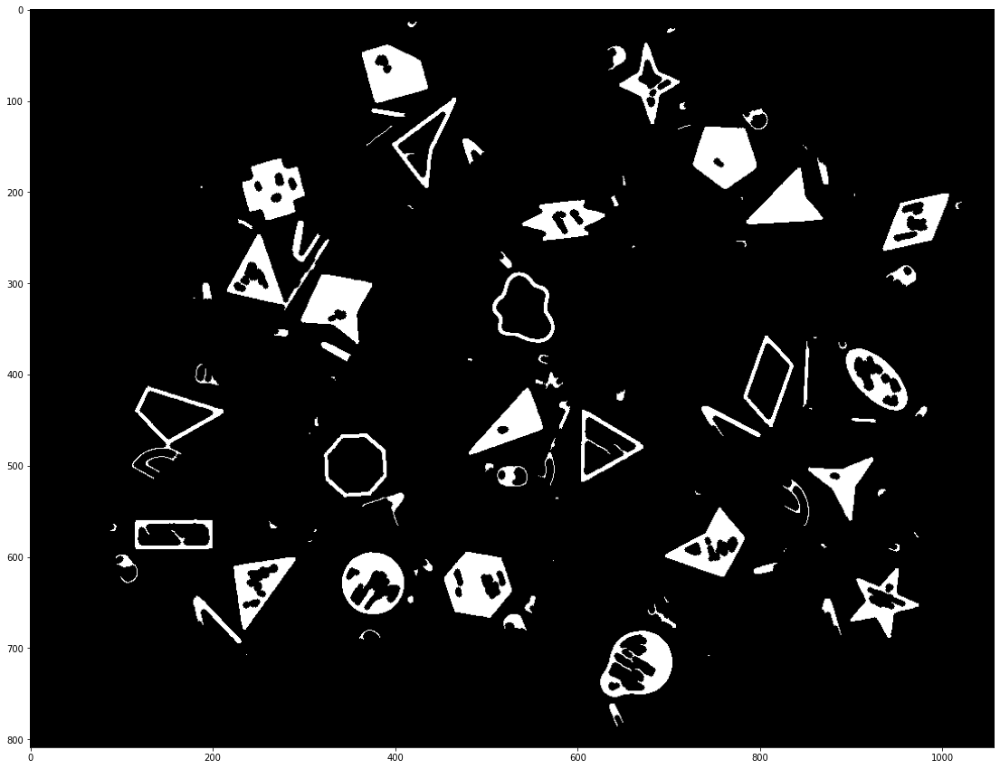

In [117]:
figures = remove_small_holes(figures)
plt.figure(figsize=(20, 15))
plt.imshow(figures)
plt.savefig('Figures_r_small_holes.jpg', format='jpg')

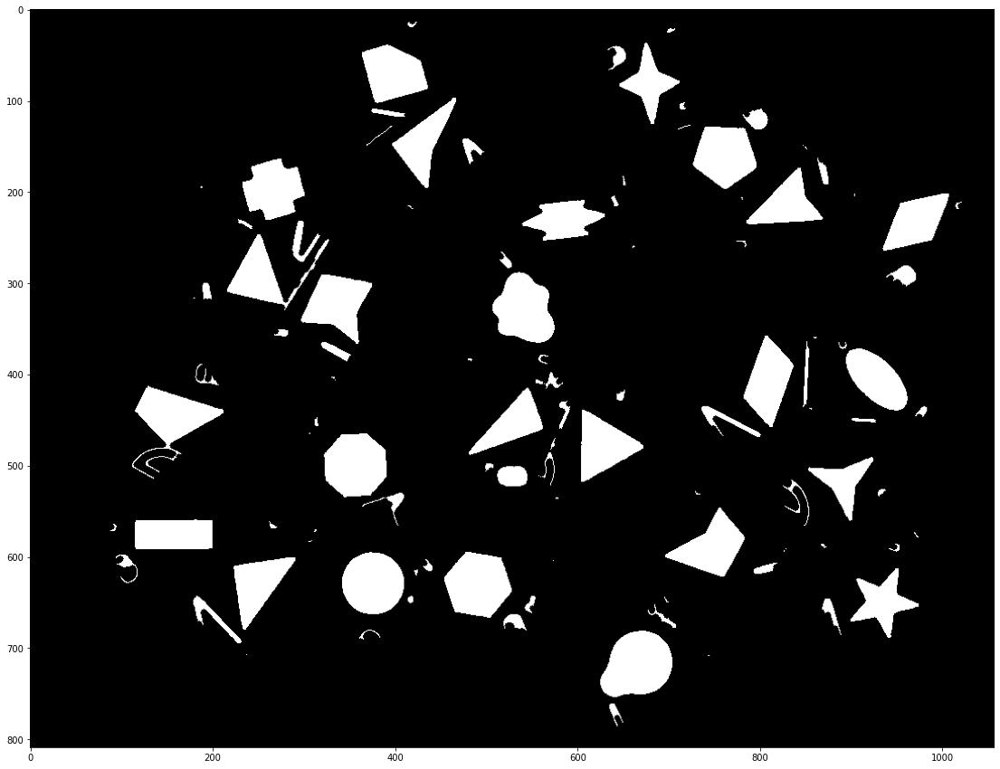

In [118]:
figures = binary_fill_holes(figures, disk(1))
plt.figure(figsize=(20, 15))
plt.imshow(figures)
plt.savefig('Figures_fill_holes.jpg', format='jpg')

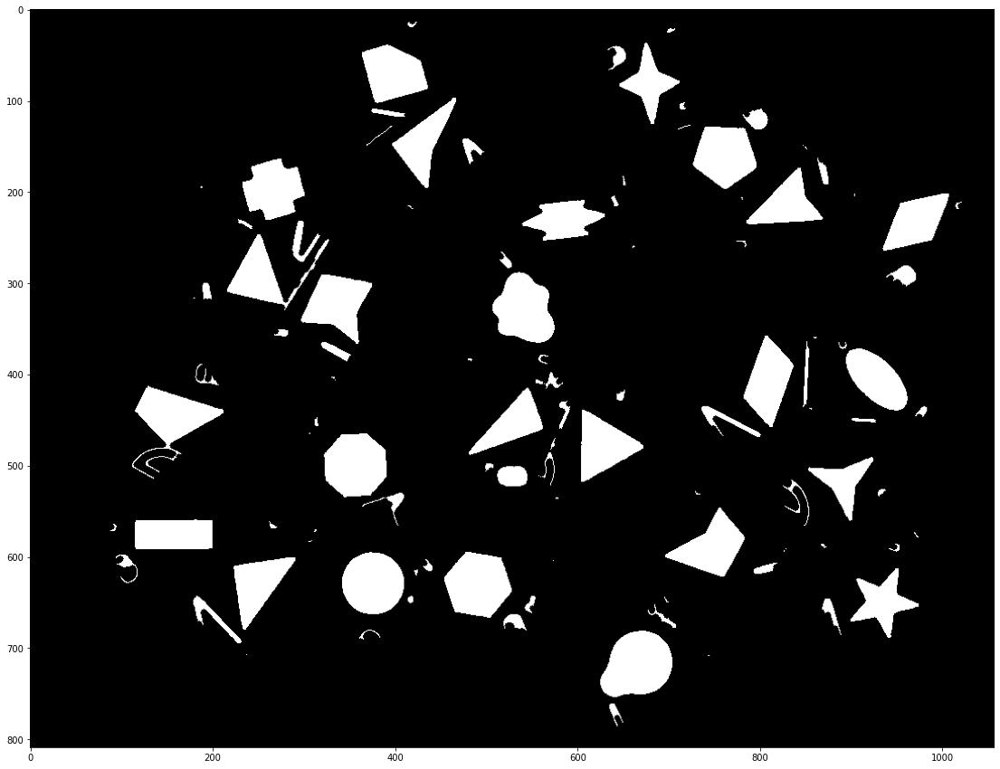

In [119]:
figures = remove_small_holes(figures)
plt.figure(figsize=(20, 15))
plt.imshow(figures)
plt.savefig('Figures_r_small_holes2.jpg', format='jpg')

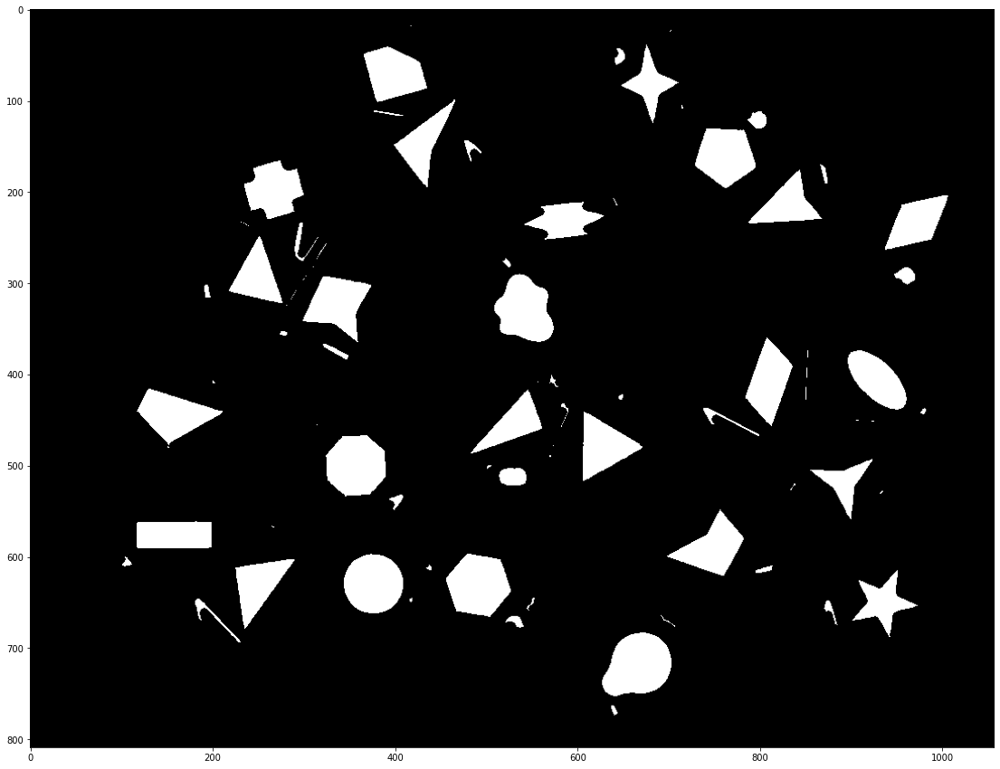

In [120]:
figures = binary_erosion(figures, octagon(2, 1))
plt.figure(figsize=(20, 15))
plt.imshow(figures)
plt.savefig('Figures_erosion.jpg', format='jpg')

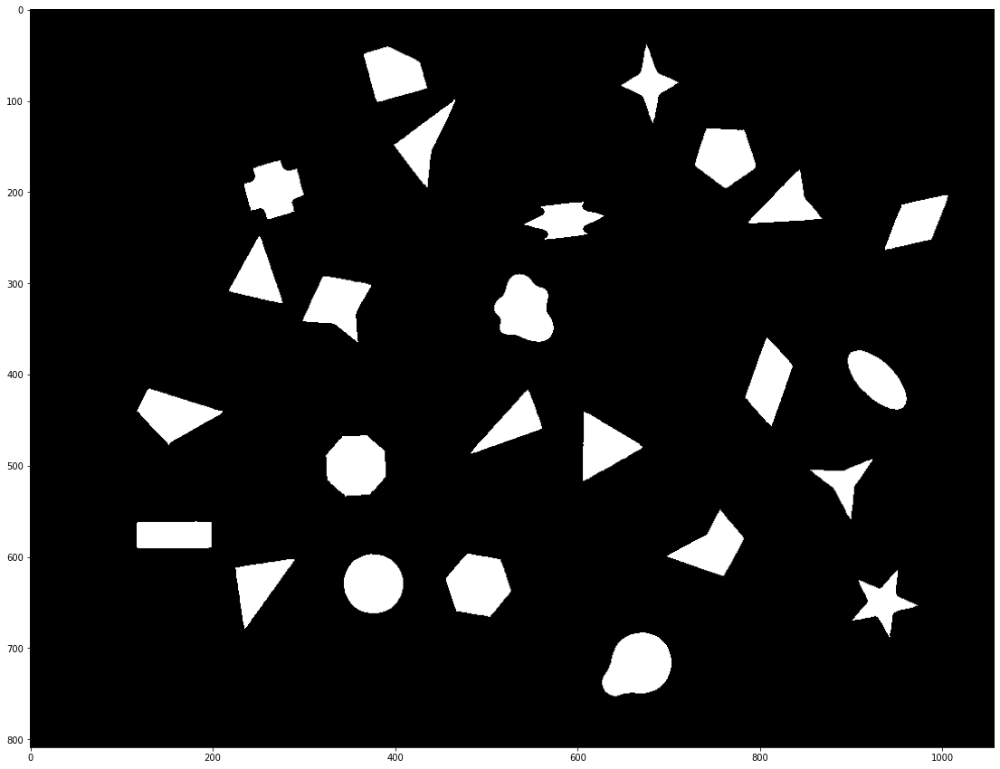

In [121]:
figures = remove_small_objects(figures, min_size=1000)
plt.figure(figsize=(20, 15))
plt.imshow(figures)
plt.savefig('Figures_r_small_objects.jpg', format='jpg')

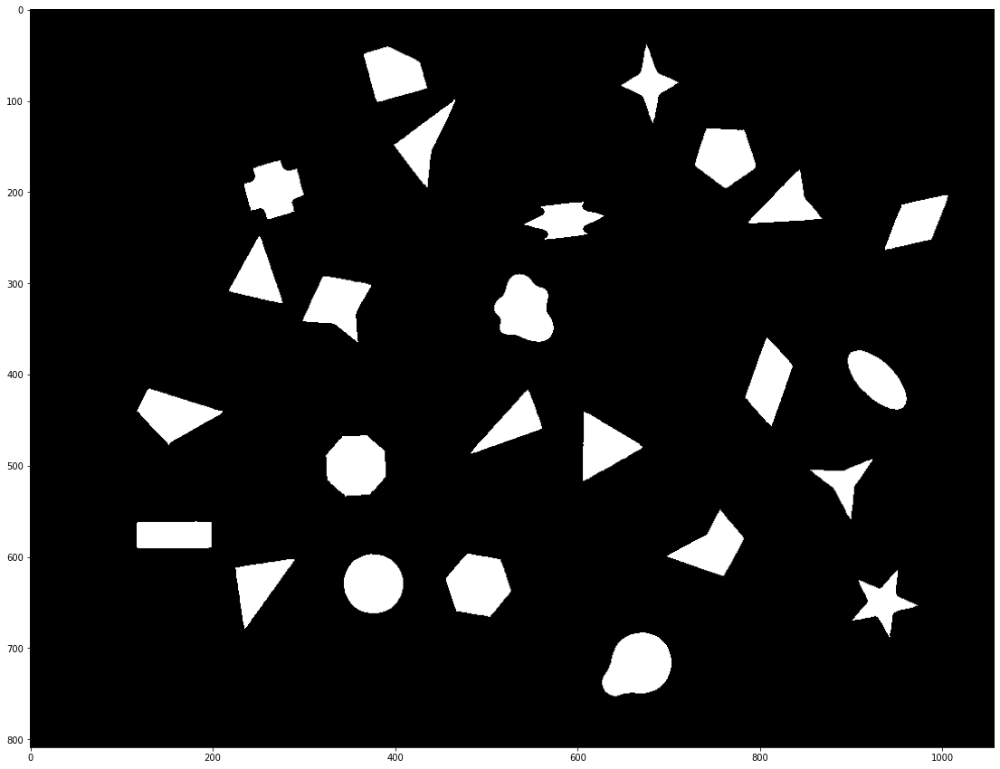

In [122]:
s_figures, s_count = detect_figures(s_img, s_mask, 1, disk(3), octagon(2, 1), 1000)
plt.figure(figsize=(20, 15))
plt.imshow(s_figures)

In [123]:
def angle(a, b):
  inner = np.inner(a, b)
  norms = np.linalg.norm(a) * np.linalg.norm(b)
  cos = inner / norms
  rad = np.arccos(np.clip(cos, -1.0, 1.0))
  return np.rad2deg(rad)

In [124]:
def find_contours_and_vertices(figures, eps):
  (cont, _) = cv2.findContours(figures.astype('uint8'), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
  contours = []
  angles = []
  centers = []
  convexity = []
  for c in cont:
    M = cv2.moments(c)
    cx = int(M['m10'] / M['m00'])
    cy = int(M['m01'] / M['m00'])
    centers.append([cx, cy])
    contours.append(c.reshape(c.shape[0], c.shape[2]))
  vertices = []
  for i in range(len(contours)):
    approx = cv2.approxPolyDP(contours[i].astype('int32'), eps, True)
    temp_angles = []
    for i in range(len(approx)):
      if i < len(approx) - 2:
        temp_angles.append(angle(approx[i] - approx[i + 1], approx[i + 2] - approx[i + 1]))
      elif i == len(approx) - 2:
        temp_angles.append(angle(approx[i] - approx[i + 1], approx[0] - approx[i + 1]))
      elif i == len(approx) - 1:
        temp_angles.append(angle(approx[i] - approx[0], approx[1] - approx[0]))
    angles.append(np.median(temp_angles))
    convexity.append(cv2.isContourConvex(approx))
    points = approx.reshape((approx.shape[0], approx.shape[2]))
    vertices.append(points)
  return contours, vertices, convexity, angles, centers

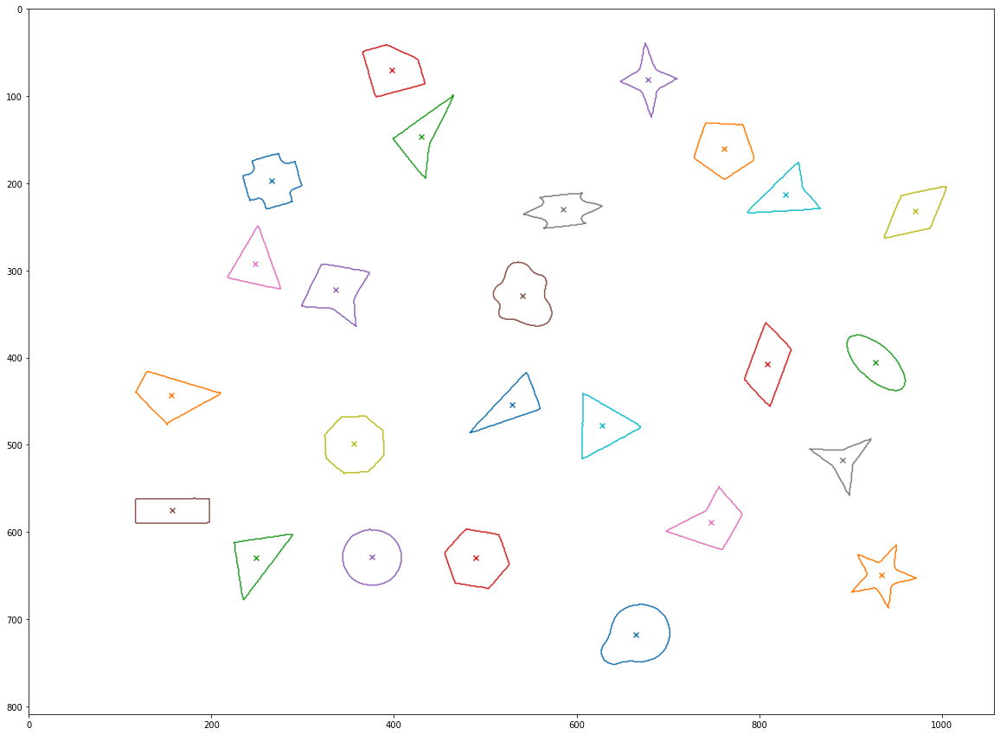

In [125]:
contours, vertices, convexity, angles, centers = find_contours_and_vertices(figures, 5)
plt.figure(figsize=(20, 15))
for i in range(len(contours)):
  plt.plot(contours[i][:, 0], contours[i][:, 1])
  plt.scatter(centers[i][0], centers[i][1], marker='x')
plt.axis((0, img_gray_scale.shape[1], img_gray_scale.shape[0], 0))  
plt.savefig('Contours.jpg', format='jpg')

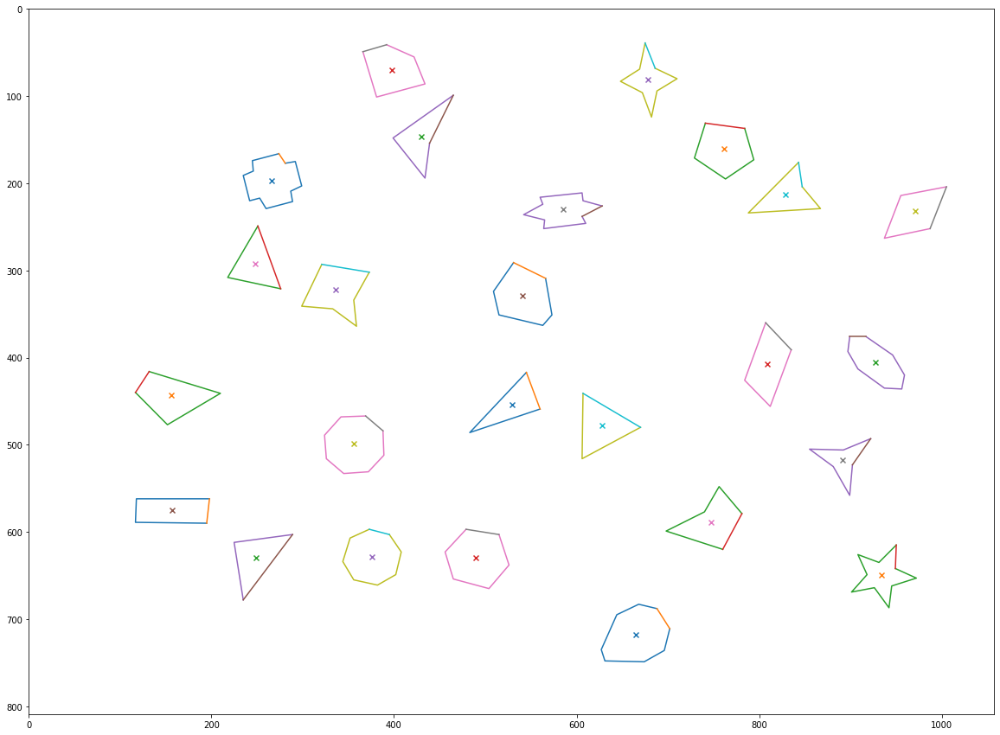

In [126]:
plt.figure(figsize=(20, 15))
for i in range(len(contours)):
  plt.plot(vertices[i][:, 0], vertices[i][:, 1])
  plt.plot([vertices[i][0, 0], vertices[i][-1, 0]], [vertices[i][0, 1], vertices[i][-1, 1]])
  plt.scatter(centers[i][0], centers[i][1], marker='x')
plt.axis((0, img_gray_scale.shape[1], img_gray_scale.shape[0], 0))  
plt.savefig('Approx_contours.jpg', format='jpg')

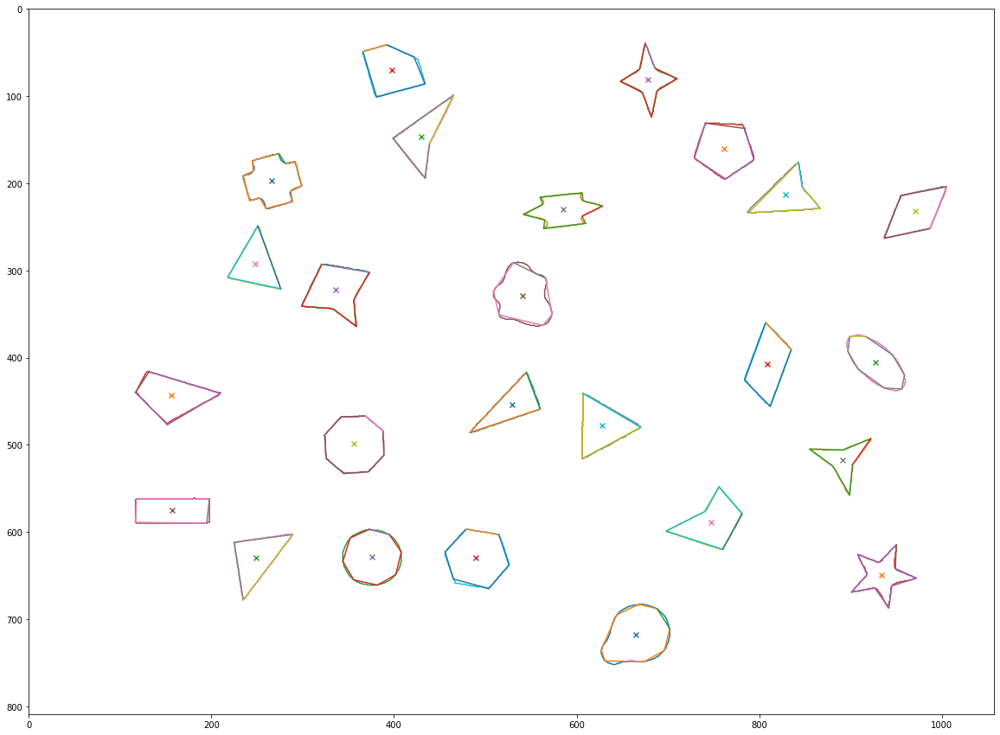

In [127]:
plt.figure(figsize=(20, 15))
for i in range(len(contours)):
  plt.plot(contours[i][:, 0], contours[i][:, 1])
  plt.plot(vertices[i][:, 0], vertices[i][:, 1])
  plt.plot([vertices[i][0, 0], vertices[i][-1, 0]], [vertices[i][0, 1], vertices[i][-1, 1]])
  plt.scatter(centers[i][0], centers[i][1], marker='x')
plt.axis((0, img_gray_scale.shape[1], img_gray_scale.shape[0], 0))  
plt.savefig('All_contours.jpg', format='jpg')

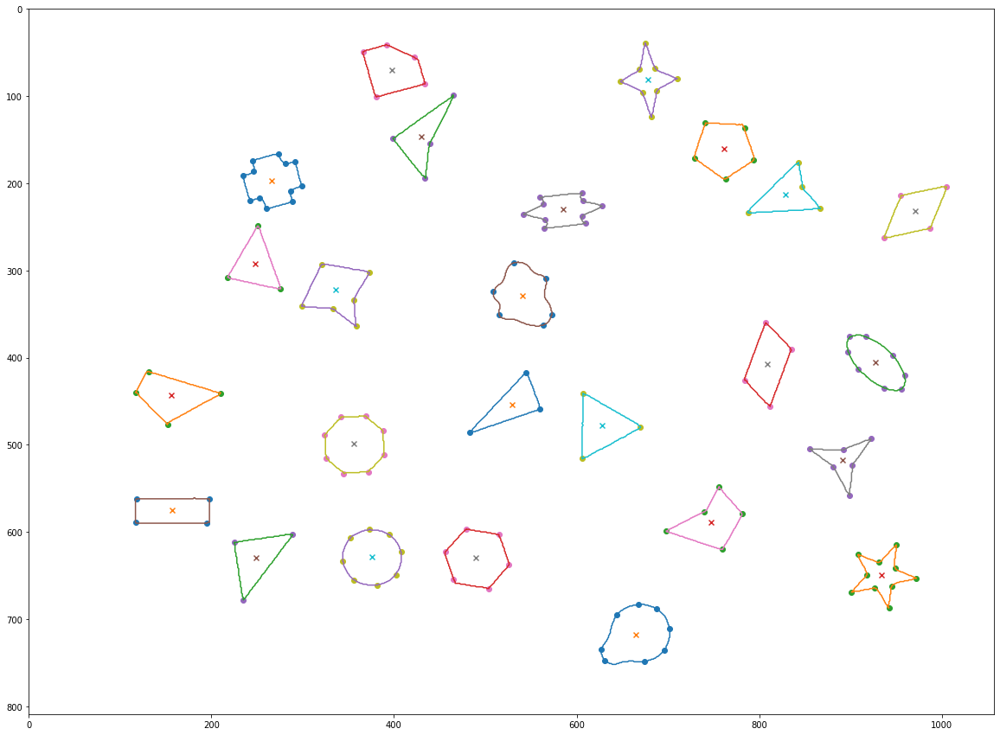

In [128]:
plt.figure(figsize=(20, 15))
for i in range(len(contours)):
  plt.plot(contours[i][:, 0], contours[i][:, 1])
  plt.scatter(vertices[i][:, 0], vertices[i][:, 1])
  plt.scatter(centers[i][0], centers[i][1], marker='x')
plt.axis((0, img_gray_scale.shape[1], img_gray_scale.shape[0], 0))  
plt.savefig('With_corners.jpg', format='jpg')

True


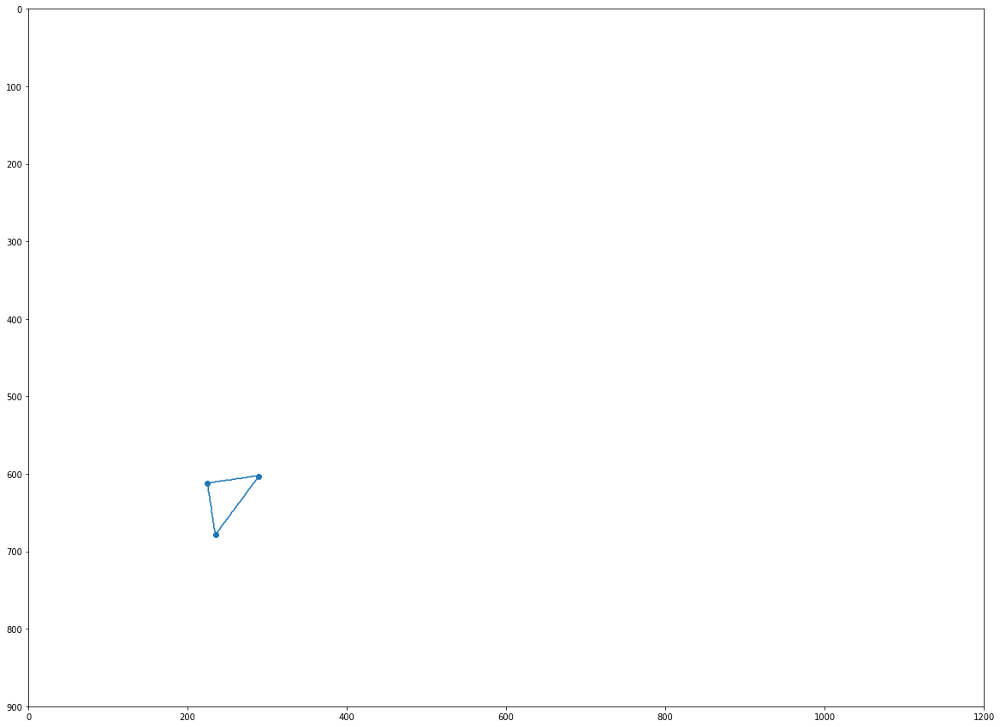

In [129]:
plt.figure(figsize=(20, 15))
i=2
plt.plot(contours[i][:, 0], contours[i][:, 1])
plt.scatter(vertices[i][:, 0], vertices[i][:, 1])
plt.axis((0, 1200, 900, 0))
print(convexity[i])  

In [132]:
def final_result(img, c, card_erosion, c_canny, med_fil_size, f_canny, closing_primitive, erosion_primitive, min_size, thresh, eps):
  img_gray_scale = one_channel(img, c)
  mask = detect_cards(img_gray_scale, card_erosion, c_canny, med_fil_size)
  figures, count = detect_figures(img_gray_scale, mask, f_canny, closing_primitive, erosion_primitive, min_size)
  contours, vertices, convexity, angles, centers = find_contours_and_vertices(figures, eps)
  print(f'{count} cards detected')
  plt.figure(figsize=(20, 15))
  h, w = img_gray_scale.shape

  plt.axis((0, w, h, 0))
  plt.imshow(img)
  for i in range(len(contours)):
    if convexity[i] and angles[i] >= thresh:
      text = '№' + str(i + 1)
      plt.text(centers[i][0], centers[i][1], text, fontsize='xx-large', color='r')
      continue
    text = '№' + str(i + 1) +' P' + str(len(vertices[i]))
    if convexity[i]:
      text += 'C'
    plt.text(centers[i][0] - 30, centers[i][1], text, fontsize='xx-large', color='r')
  plt.axis('off')
  plt.savefig('Result.jpg', format='jpg')
  return contours, vertices, convexity, centers, count 


25 cards detected


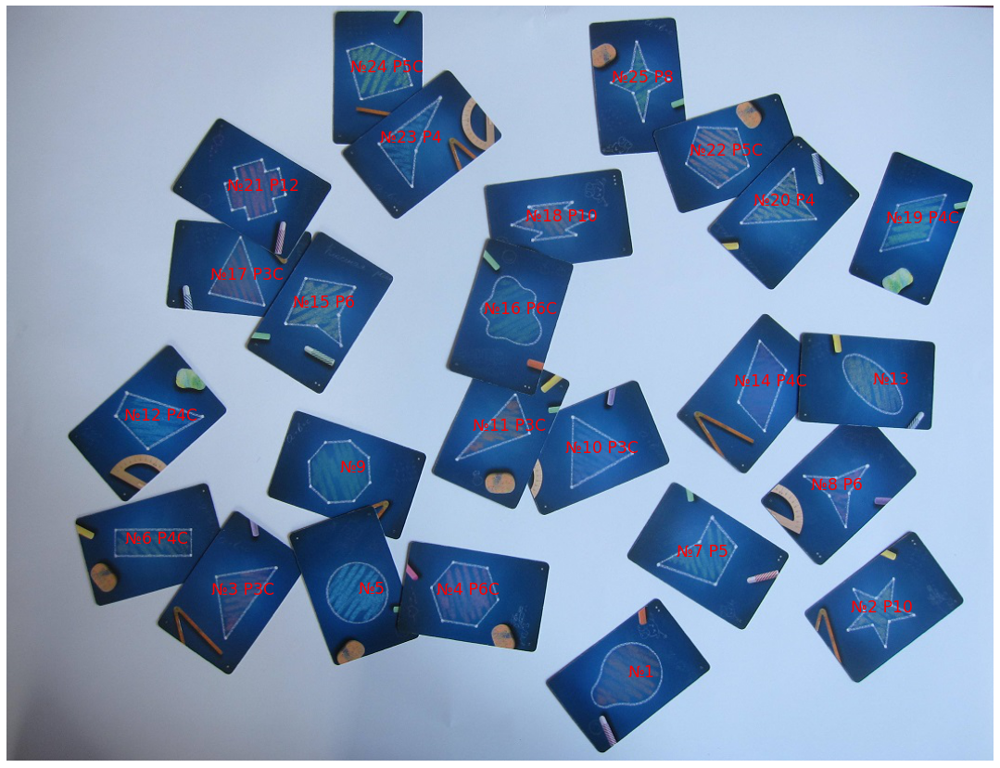

In [133]:
img = images[3]
c_prim = disk(3)
e_prim = octagon(2, 1)
contours, vertices, convexity, centers, count = final_result(img, 'r', 10, 1.5, 1, 1, c_prim, e_prim, 1000, 133, 5)

# **Примеры результатов на других изображениях**

16 cards detected


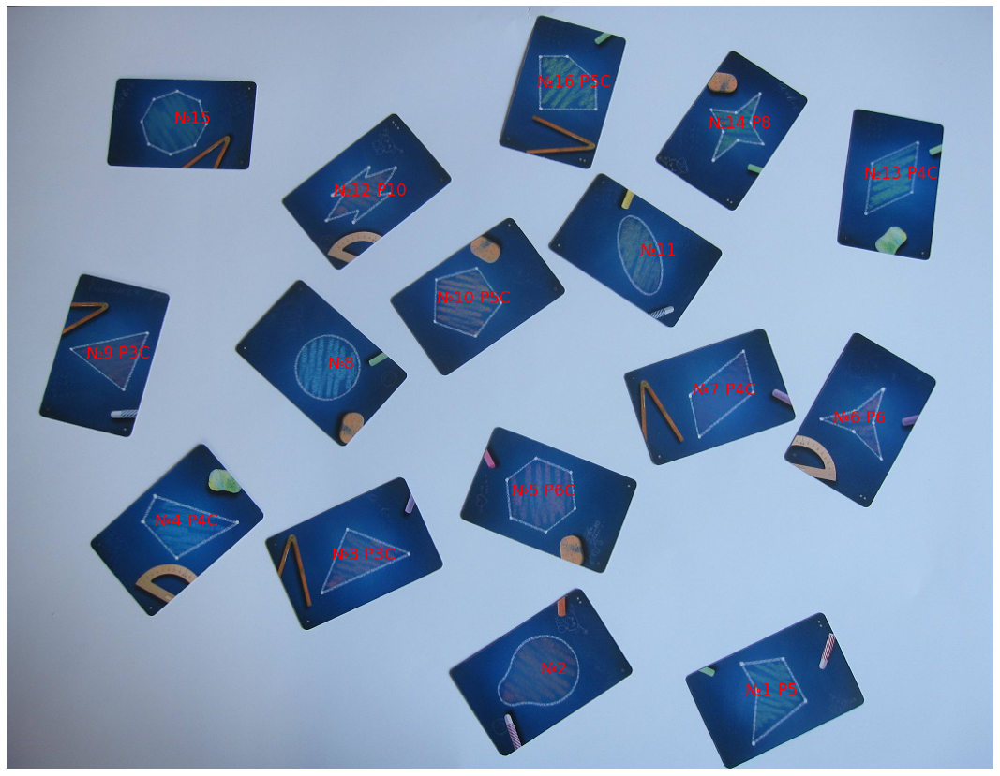

In [134]:
img = images[1]
c_prim = disk(3)
e_prim = octagon(2, 1)
contours, vertices, convexity, centers, count = final_result(img, 'r', 10, 1.5, 1, 1, c_prim, e_prim, 1000, 133, 5)

21 cards detected


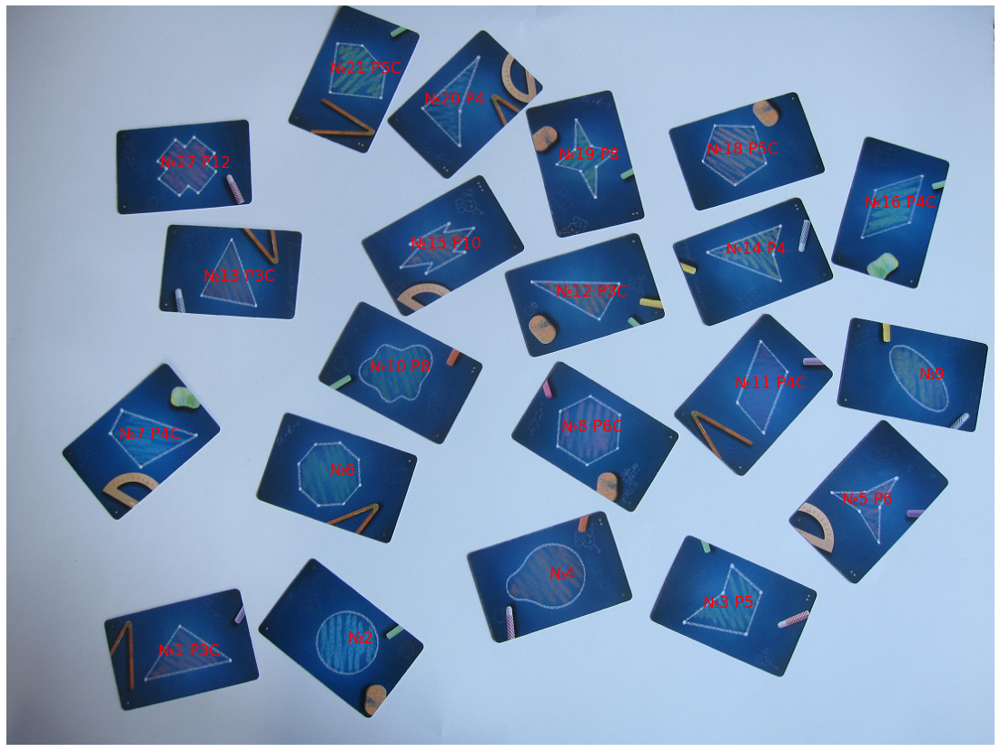

In [135]:
img = images[2]
c_prim = disk(3)
e_prim = octagon(2, 1)
contours, vertices, convexity, centers, count = final_result(img, 'r', 10, 1.5, 1, 1, c_prim, e_prim, 1000, 133, 5)

24 cards detected


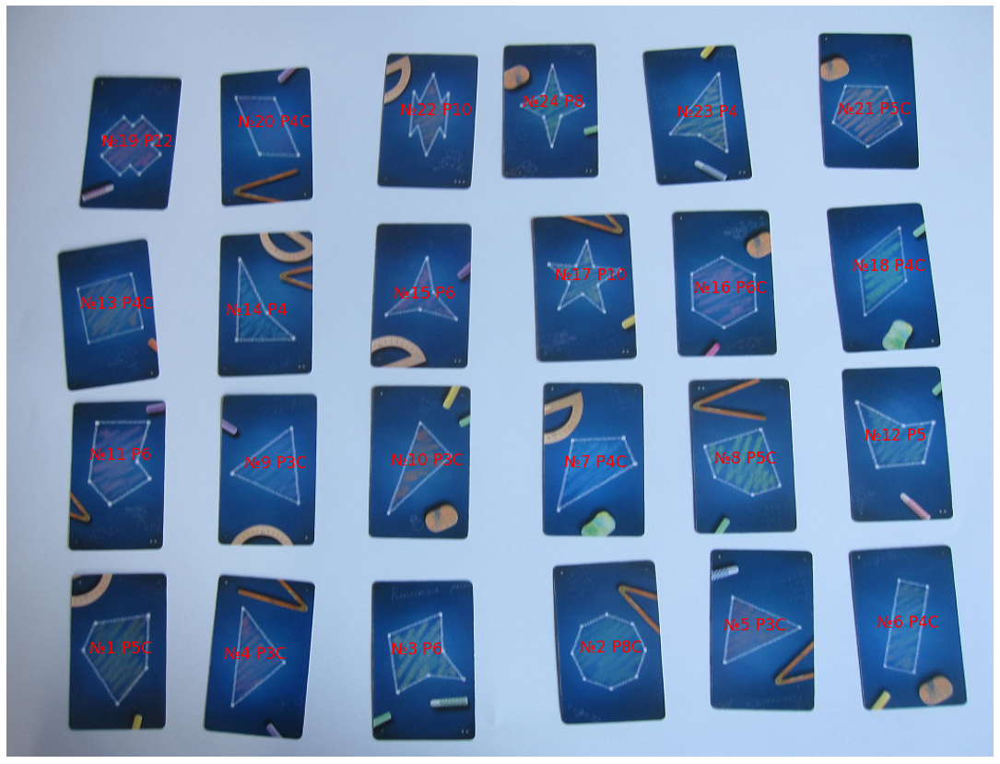

In [136]:
img = images[4]
c_prim = disk(3)
e_prim = octagon(1, 1)
contours, vertices, convexity, centers, count = final_result(img, 'r', 10, 1.5, 1, 1, c_prim, e_prim, 1000, 1000, 5)

18 cards detected


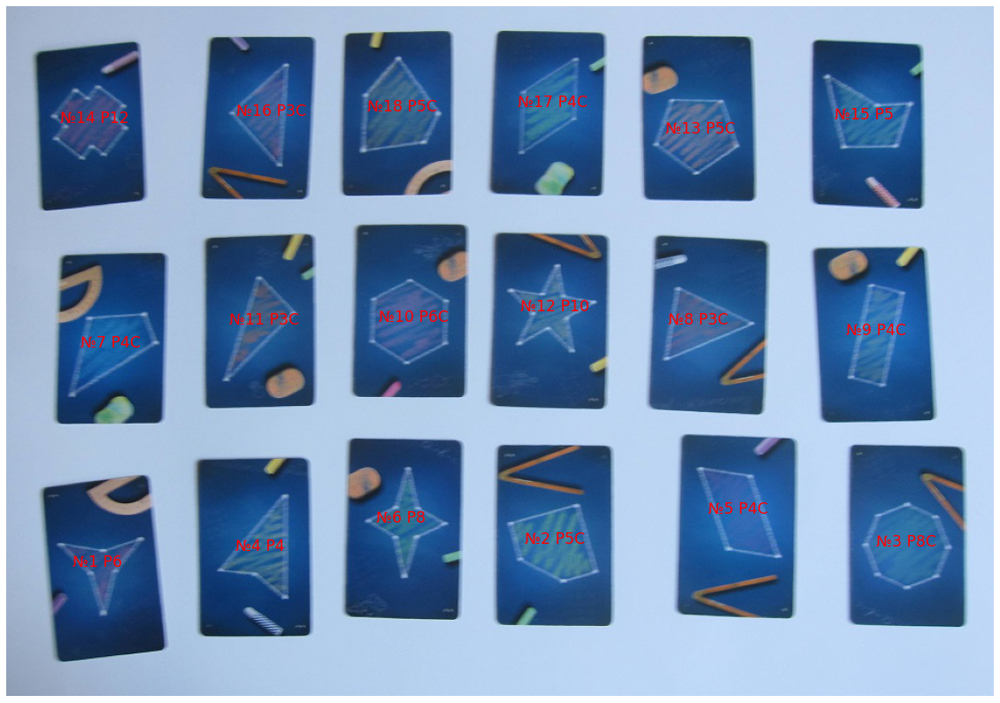

In [137]:
img = images[5]
c_prim = disk(3)
e_prim = octagon(2, 1)
contours, vertices, convexity, centers, count = final_result(img, 'r', 10, 1.5, 1, 1, c_prim, e_prim, 1000, 1000, 5)